# Import libraries

In [1]:
!pip uninstall -y torch torchvision torchaudio torchtext

Found existing installation: torch 2.4.0
Uninstalling torch-2.4.0:
  Successfully uninstalled torch-2.4.0
Found existing installation: torchvision 0.19.0
Uninstalling torchvision-0.19.0:
  Successfully uninstalled torchvision-0.19.0
Found existing installation: torchaudio 2.4.0
Uninstalling torchaudio-2.4.0:
  Successfully uninstalled torchaudio-2.4.0


In [2]:
!pip uninstall -y torch torchvision torchaudio torchtext

In [3]:
!pip  install  torchvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 51.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 797.1/797.1 MB 1.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 76.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 62.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 2.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 28.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 13.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 8.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━

In [4]:
!git clone https://github.com/huggingface/diffusers.git
%cd diffusers
!pip install .
%cd ..

Cloning into 'diffusers'...
remote: Enumerating objects: 71099, done.
remote: Counting objects: 100% (655/655), done.
remote: Compressing objects: 100% (359/359), done.
remote: Total 71099 (delta 405), reused 401 (delta 239), pack-reused 70444 (from 1)
Receiving objects: 100% (71099/71099), 50.05 MiB | 26.61 MiB/s, done.
Resolving deltas: 100% (52483/52483), done.
/kaggle/working/diffusers
Processing /kaggle/working/diffusers
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.31.0.dev0-py3-none-any.whl size=2772952 sha256=c0b07f5451e402837399197611177919ea1f03b8afb115e0477dc136112f2f8a
  Stored in directory: /tmp/pip-ephem-wheel-cache-zbfrjj88/wheels/f5/3d/4b/8e63ecf8f8467b91f49c2a926abe66393983fca5c47830e6e6
Successfully built diffusers
/kaggle/working


In [5]:
!git clone https://github.com/huggingface/peft.git
%cd peft
!pip install .
%cd ..

Cloning into 'peft'...
remote: Enumerating objects: 9099, done.
remote: Counting objects: 100% (229/229), done.
remote: Compressing objects: 100% (181/181), done.
remote: Total 9099 (delta 115), reused 95 (delta 33), pack-reused 8870 (from 1)
Receiving objects: 100% (9099/9099), 13.56 MiB | 27.06 MiB/s, done.
Resolving deltas: 100% (6083/6083), done.
/kaggle/working/peft
Processing /kaggle/working/peft
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for peft: filename=peft-0.12.1.dev0-py3-none-any.whl size=320654 sha256=4f8c7d1f696593ab3cd9e168d1b9383a7795db504102c73f8401c6308a08343d
  Stored in directory: /tmp/pip-ephem-wheel-cache-cu4hsxbb/wheels/ee/96/2d/c63fa52f4c941af6baec12df232bc31d917cd74e1eacad0a4a
Successfully built peft
/kaggle/working


In [6]:
import torch, transformers, diffusers, accelerate, peft
torch.__version__, transformers.__version__, peft.__version__

('2.4.1+cu121', '4.44.0', '0.12.1.dev0')

In [7]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F
from torchvision import transforms
import transformers, datasets, diffusers
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers.models import AutoencoderKL, UNet2DConditionModel
from diffusers.schedulers import DDPMScheduler
from diffusers.optimization import get_scheduler
from diffusers.utils import convert_state_dict_to_diffusers
from diffusers.training_utils import cast_training_params

from peft import LoraConfig
from peft.utils import get_peft_model_state_dict

from tqdm import tqdm

from PIL import Image

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [9]:
from torch.utils.data import Dataset
from PIL import Image
import os

# Loading data

In [10]:
class ApusherDataset(Dataset):
    def __init__(self, image_dir, captions_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        with open(captions_file, 'r') as f:
            self.captions = {line.split(":")[0]: line.split(":")[1].strip() for line in f.readlines()}
        self.image_files = list(self.captions.keys())

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.image_dir, img_name+".jpg")
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        caption = self.captions[img_name]
        return image, caption

In [12]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

In [13]:
from torch.utils.data import DataLoader

image_dir = "/kaggle/input/apusher-dataset-v2/Apusher_dataset/images"
captions_file = "/kaggle/input/apusher-dataset-v2/Apusher_dataset/captions.txt"

dataset = ApusherDataset(image_dir, captions_file, transform=transform)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

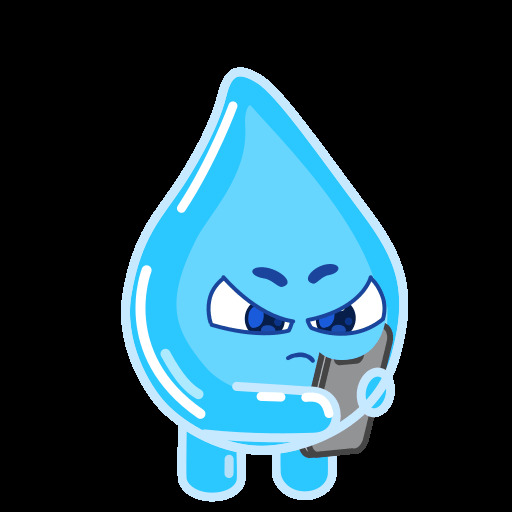

In [14]:
import torchvision.transforms as transforms

pilImg = transforms.ToPILImage()(dataset[0][0])

pilImg

In [15]:
dataset[0][0].size()

torch.Size([3, 512, 512])

# Loading model

In [16]:
PRE_TRAINED_MODEL_NAME="stabilityai/stable-diffusion-2-1"

noise_scheduler = DDPMScheduler.from_pretrained(
    PRE_TRAINED_MODEL_NAME,
    subfolder="scheduler"
)

tokenizer = CLIPTokenizer.from_pretrained(
    PRE_TRAINED_MODEL_NAME,
    subfolder="tokenizer"
)

# 학습 파라미터 있으나 고정될 것임
text_encoder = CLIPTextModel.from_pretrained(
    PRE_TRAINED_MODEL_NAME,
    subfolder="text_encoder"
)

# 학습 파라미터 있으나 고정될 것임
vae = AutoencoderKL.from_pretrained(
    PRE_TRAINED_MODEL_NAME,
    subfolder="vae"
)

# 학습 파라미터 있고 파인튜닝 될 것임
unet = UNet2DConditionModel.from_pretrained(
    PRE_TRAINED_MODEL_NAME,
    subfolder="unet"
)

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

In [17]:
tokenizer.model_max_length

77

In [18]:
tokenizer(dataset[0][1],
          max_length=tokenizer.model_max_length,
          padding='max_length',
          truncation=True,
          return_tensors='pt')

{'input_ids': tensor([[49406,   257, 22166,  4510,   533,  2862,   593,   518,  1951,   537,
           533,  9054,   257, 49407,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [19]:
def tokenize_captions(examples, caption_column=1, is_train=True):
    captions = []

    for caption in examples[caption_column]:
        if isinstance(caption, str):
            captions.append(caption)
        elif isinstance(caption, (list, np.ndarray)):
            # take a random caption if there are multiple
            captions.append(random.choice(caption) if is_train else caption[0])
        else:
            raise ValueError(
                f"Caption column `{caption_column}` should contain either strings or lists of strings."
            )
    inputs = tokenizer(
        captions, max_length=tokenizer.model_max_length, padding="max_length", truncation=True, return_tensors="pt"
    )

    return inputs.input_ids

In [20]:
IMG_SIZE = 512
CENTER_CROP = True
RANDOM_FLIP = True

In [21]:
train_transforms = transforms.Compose(
    [
        transforms.Resize(IMG_SIZE, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(IMG_SIZE) if CENTER_CROP else transforms.RandomCrop(IMG_SIZE),
        transforms.RandomHorizontalFlip() if RANDOM_FLIP else transforms.Lambda(lambda x: x),
        transforms.ToTensor()
    ]
)

In [23]:
def collate_fn(examples):
    # (C, H, W), ..., (C, H, W) -> stack -> (N, C, H, W): 
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    # tensor.contiguous()
    pixel_values = pixel_values.to(memory_format=torch.contiguous_format).float()

    # {(77,), ..., (77,)}_N개 -> stack -> (N, 77)
    input_ids = torch.stack([example["input_ids"] for example in examples])

    return {"pixel_values": pixel_values, "input_ids": input_ids}

In [24]:
train_dataset = dataset

In [25]:
BATCH_SIZE = 4
NUM_WORKERS = 4

# DataLoaders creation:
train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    shuffle=True,
    collate_fn=collate_fn,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
)

In [26]:
weight_dtype = torch.float16 # half precision

In [27]:
unet.requires_grad_(False)
vae.requires_grad_(False)
text_encoder.requires_grad_(False);

In [28]:
LORA_RANK = 4

# Freeze the unet parameters before adding adapters
for param in unet.parameters():
    param.requires_grad_(False)

unet_lora_config = LoraConfig(
    r=LORA_RANK,
    lora_alpha=LORA_RANK,
    init_lora_weights="gaussian",
    target_modules=["to_k", "to_q", "to_v", "to_out.0"],
)

In [29]:
text_encoder.to(device);
vae.to(device);
unet.to(device);

In [30]:
# Add adapter and make sure the trainable params are in float32.
unet.add_adapter(unet_lora_config)

if weight_dtype == torch.float16:
    # only upcast trainable parameters (LoRA) into fp32
    cast_training_params(unet, dtype=torch.float32)

lora_layers = filter(lambda p: p.requires_grad, unet.parameters())

In [31]:
lora_layers = filter(lambda p: p.requires_grad, unet.parameters())

In [32]:
EPOCHS = 1000
LEARNING_RATE = 1e-04

optimizer = torch.optim.AdamW(
        lora_layers,
        lr=LEARNING_RATE
    )

In [33]:
lr_scheduler = get_scheduler(
        'linear',
        optimizer=optimizer,
        num_warmup_steps=500,
        num_training_steps=EPOCHS * len(train_dataloader)
    )

In [34]:
noise_scheduler.config.prediction_type, vae.config.scaling_factor

('v_prediction', 0.18215)

# Train model

In [35]:
use_amp = True
scaler = torch.cuda.amp.GradScaler(enabled=use_amp)
prediction_type = None # 'epsilon'  or 'v_prediction'

train_losses = []

for epoch in range(EPOCHS):
    for step, batch in enumerate(tqdm(dataloader)):

        with torch.autocast(device_type=device, dtype=weight_dtype, enabled=use_amp):
            images = []
            for item in batch:
                images.append(item[0])
            # Convert images to latent space
            latents = vae.encode(
                batch[0].to(device)
            ).latent_dist.sample()
            latents = latents * vae.config.scaling_factor

            # Sample noise that we'll add to the latents
            noise = torch.randn_like(latents)

            bsz = latents.shape[0]
            # Sample a random timestep for each image
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (bsz,), device=latents.device)
            timesteps = timesteps.long()

            # Add noise to the latents according to the noise magnitude at each timestep
            # (this is the forward diffusion process)
            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

            # Get the text embedding for conditioning, [0]: last_hidden_state
            encoder_hidden_states = text_encoder(torch.tensor(tokenizer(batch[1], padding = True)['input_ids']).to(device))[0]

            if prediction_type is not None:
                # set prediction_type of scheduler if defined
                noise_scheduler.register_to_config(prediction_type=prediction_type)

            if noise_scheduler.config.prediction_type == "epsilon":
                target = noise
            elif noise_scheduler.config.prediction_type == "v_prediction":
                target = noise_scheduler.get_velocity(latents, noise, timesteps)
            else:
                raise ValueError(f"Unknown prediction type {noise_scheduler.config.prediction_type}")

            # Predict the noise residual and compute loss
            model_pred = unet(noisy_latents, timesteps, encoder_hidden_states).sample

            loss = F.mse_loss(model_pred.float(), target.float(), reduction="mean")


        with torch.no_grad():
            train_losses.append(loss.item())

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        lr_scheduler.step()
        optimizer.zero_grad()

    # print loss
    if epoch%10==1:
        avg_loss = sum(train_losses[-100:])/100
        print(f'Finished epoch {epoch+1}. Average of the last 100 loss values: {avg_loss:05f}')


/tmp/ipykernel_36/997737161.py:2: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)
100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 2. Average of the last 100 loss values: 0.033198


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 12. Average of the last 100 loss values: 0.190810


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 22. Average of the last 100 loss values: 0.193350


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 32. Average of the last 100 loss values: 0.174091


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 42. Average of the last 100 loss values: 0.174772


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 52. Average of the last 100 loss values: 0.171871


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 72. Average of the last 100 loss values: 0.153719


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 82. Average of the last 100 loss values: 0.155005


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 92. Average of the last 100 loss values: 0.161135


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 102. Average of the last 100 loss values: 0.156153


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 112. Average of the last 100 loss values: 0.155526


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 122. Average of the last 100 loss values: 0.147499


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 132. Average of the last 100 loss values: 0.143296


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 142. Average of the last 100 loss values: 0.150949


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 152. Average of the last 100 loss values: 0.152424


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 162. Average of the last 100 loss values: 0.143828


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 172. Average of the last 100 loss values: 0.148296


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 182. Average of the last 100 loss values: 0.146681


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 192. Average of the last 100 loss values: 0.140238


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 202. Average of the last 100 loss values: 0.141447


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 212. Average of the last 100 loss values: 0.143707


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 222. Average of the last 100 loss values: 0.135719


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 232. Average of the last 100 loss values: 0.131028


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 242. Average of the last 100 loss values: 0.141099


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 252. Average of the last 100 loss values: 0.132388


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 262. Average of the last 100 loss values: 0.137863


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 272. Average of the last 100 loss values: 0.141757


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 282. Average of the last 100 loss values: 0.133900


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 292. Average of the last 100 loss values: 0.128871


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 302. Average of the last 100 loss values: 0.138494


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 312. Average of the last 100 loss values: 0.129651


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 322. Average of the last 100 loss values: 0.126785


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 332. Average of the last 100 loss values: 0.135474


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 342. Average of the last 100 loss values: 0.136887


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 352. Average of the last 100 loss values: 0.132177


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 362. Average of the last 100 loss values: 0.128673


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 372. Average of the last 100 loss values: 0.133426


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 382. Average of the last 100 loss values: 0.128122


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 392. Average of the last 100 loss values: 0.129561


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 402. Average of the last 100 loss values: 0.121975


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 412. Average of the last 100 loss values: 0.124453


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 422. Average of the last 100 loss values: 0.131361


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 432. Average of the last 100 loss values: 0.127831


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 442. Average of the last 100 loss values: 0.126997


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 452. Average of the last 100 loss values: 0.121142


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 462. Average of the last 100 loss values: 0.129667


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 472. Average of the last 100 loss values: 0.131787


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 482. Average of the last 100 loss values: 0.122458


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 492. Average of the last 100 loss values: 0.115889


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 502. Average of the last 100 loss values: 0.128158


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 512. Average of the last 100 loss values: 0.123389


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 522. Average of the last 100 loss values: 0.122328


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 532. Average of the last 100 loss values: 0.121434


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 542. Average of the last 100 loss values: 0.117272


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 552. Average of the last 100 loss values: 0.123570


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 562. Average of the last 100 loss values: 0.119715


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 572. Average of the last 100 loss values: 0.115818


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 582. Average of the last 100 loss values: 0.117569


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 592. Average of the last 100 loss values: 0.120887


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 602. Average of the last 100 loss values: 0.117492


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 612. Average of the last 100 loss values: 0.116914


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 622. Average of the last 100 loss values: 0.118959


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 632. Average of the last 100 loss values: 0.113543


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 642. Average of the last 100 loss values: 0.119830


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 652. Average of the last 100 loss values: 0.111474


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 662. Average of the last 100 loss values: 0.115616


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 672. Average of the last 100 loss values: 0.115181


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 682. Average of the last 100 loss values: 0.113792


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 692. Average of the last 100 loss values: 0.111069


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 702. Average of the last 100 loss values: 0.114054


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 712. Average of the last 100 loss values: 0.105278


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 722. Average of the last 100 loss values: 0.111962


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 732. Average of the last 100 loss values: 0.109568


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 742. Average of the last 100 loss values: 0.107426


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 752. Average of the last 100 loss values: 0.108515


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 762. Average of the last 100 loss values: 0.105983


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 772. Average of the last 100 loss values: 0.112880


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 782. Average of the last 100 loss values: 0.104767


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 792. Average of the last 100 loss values: 0.106506


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 802. Average of the last 100 loss values: 0.110075


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 812. Average of the last 100 loss values: 0.110087


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 822. Average of the last 100 loss values: 0.113537


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 832. Average of the last 100 loss values: 0.115510


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 842. Average of the last 100 loss values: 0.109894


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 852. Average of the last 100 loss values: 0.108924


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 862. Average of the last 100 loss values: 0.105852


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 872. Average of the last 100 loss values: 0.104376


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 882. Average of the last 100 loss values: 0.102791


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 892. Average of the last 100 loss values: 0.111757


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 902. Average of the last 100 loss values: 0.107222


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 912. Average of the last 100 loss values: 0.107629


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 922. Average of the last 100 loss values: 0.107862


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 932. Average of the last 100 loss values: 0.110612


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 942. Average of the last 100 loss values: 0.108052


100%|██████████| 9/9 [00:20<00:00,  2.32s/it]


Finished epoch 952. Average of the last 100 loss values: 0.108170


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 962. Average of the last 100 loss values: 0.105552


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 972. Average of the last 100 loss values: 0.105036


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 982. Average of the last 100 loss values: 0.104705


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


Finished epoch 992. Average of the last 100 loss values: 0.107388


100%|██████████| 9/9 [00:20<00:00,  2.31s/it]


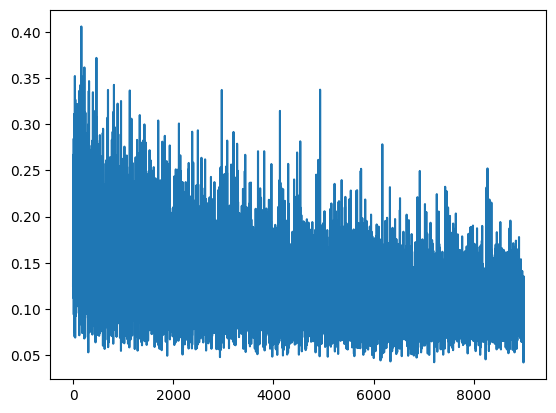

In [36]:
plt.plot(train_losses)
plt.show()

In [37]:
import pandas as pd

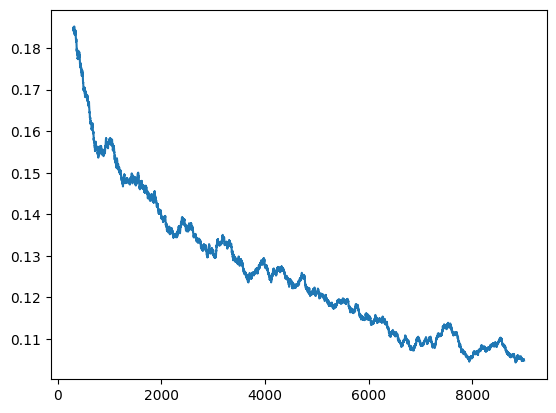

In [39]:
losses_sr = pd.Series(train_losses)
loss_mv = losses_sr.rolling(window=300).mean()

plt.plot(loss_mv)

In [40]:
from diffusers import StableDiffusionPipeline

In [41]:
pipeline = StableDiffusionPipeline.from_pretrained(
    PRE_TRAINED_MODEL_NAME,
    text_encoder=text_encoder,
    vae=vae,
    unet=unet
)

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

# Example of how the model works 

  0%|          | 0/20 [00:00<?, ?it/s]

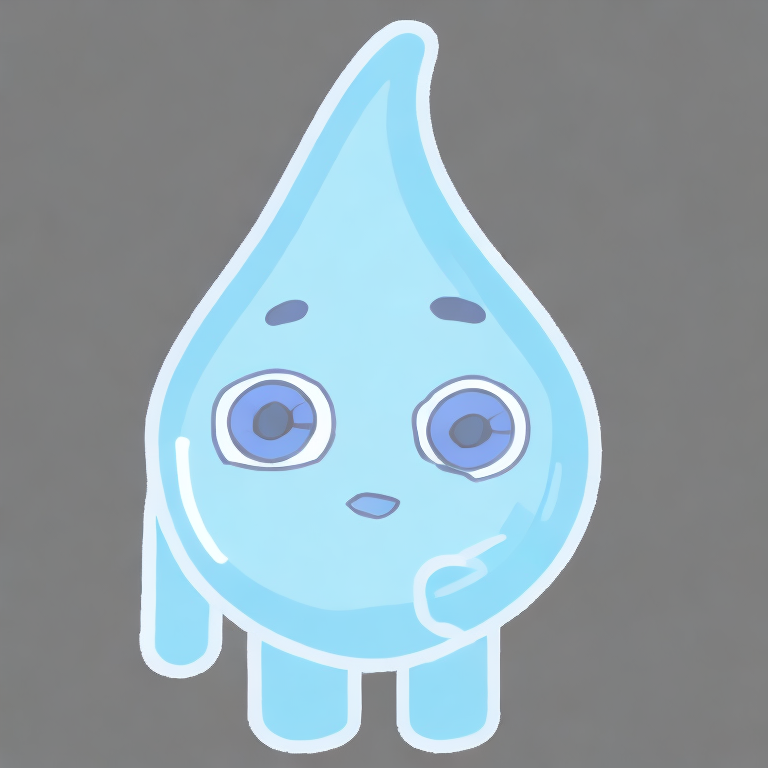

In [43]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

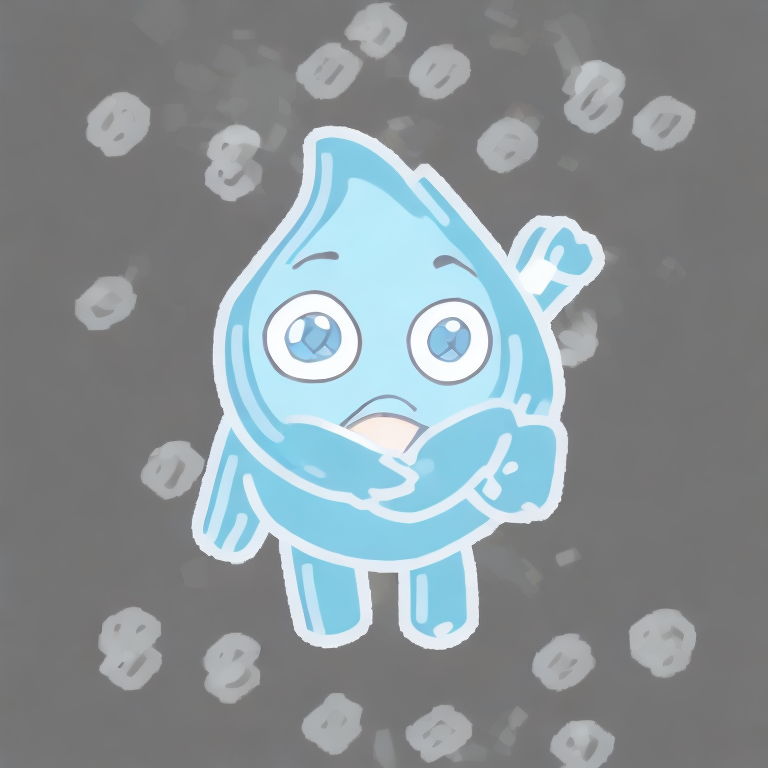

In [44]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher jump"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

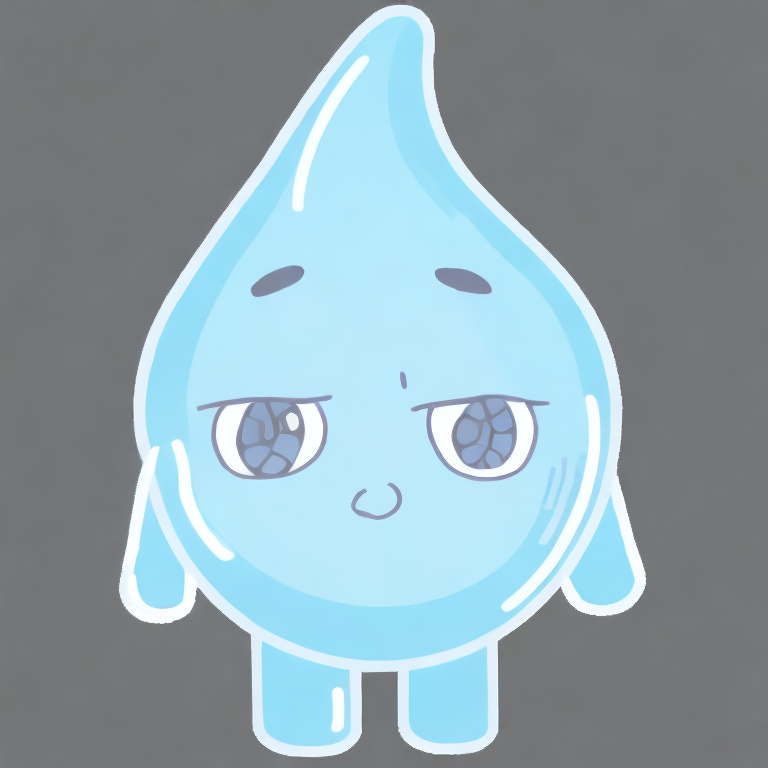

In [45]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["sad Apusher"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

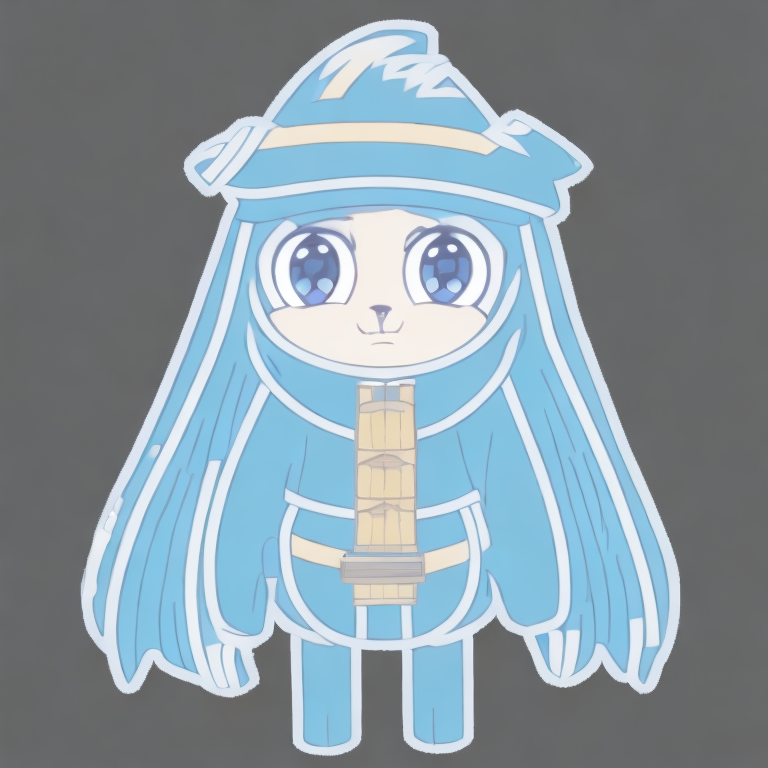

In [50]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher anime"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

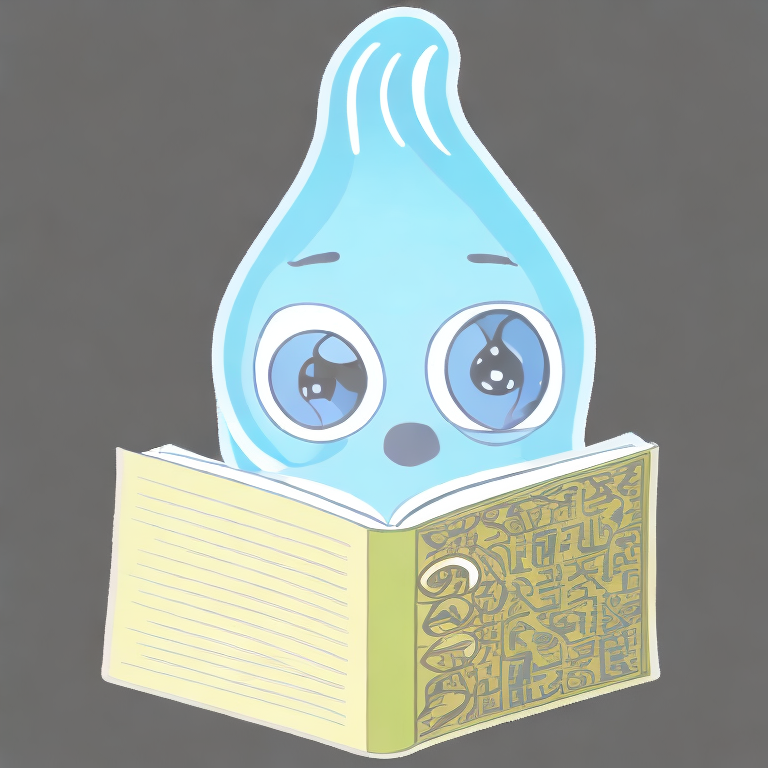

In [61]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher read the book"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

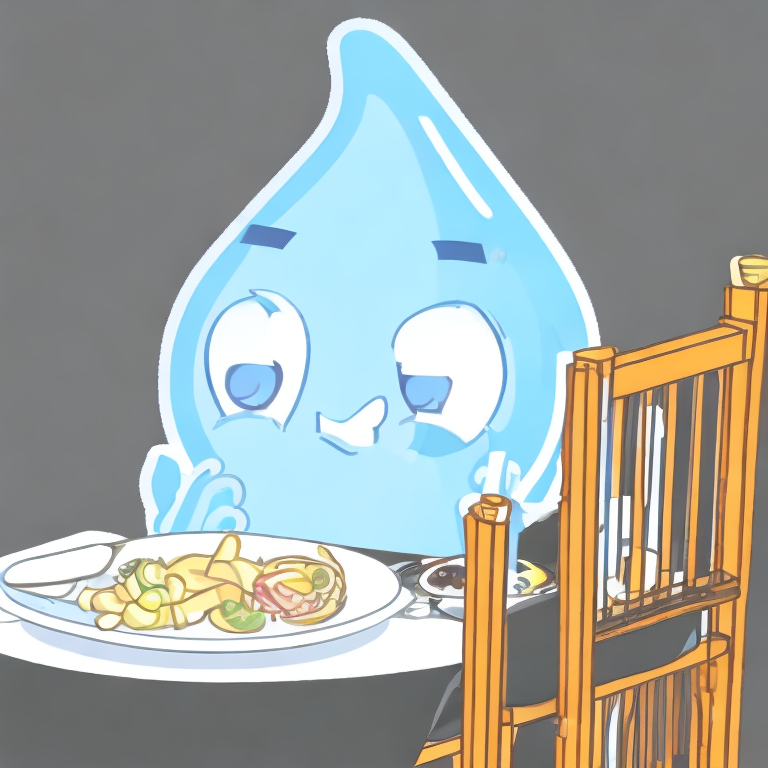

In [67]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher smiles in restraunt"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

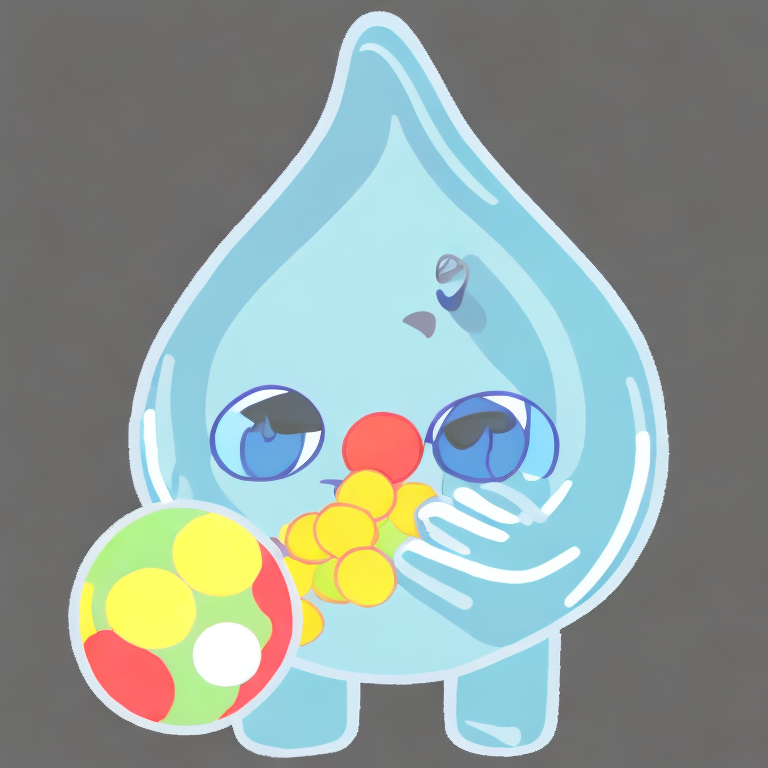

In [71]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher play with ball"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

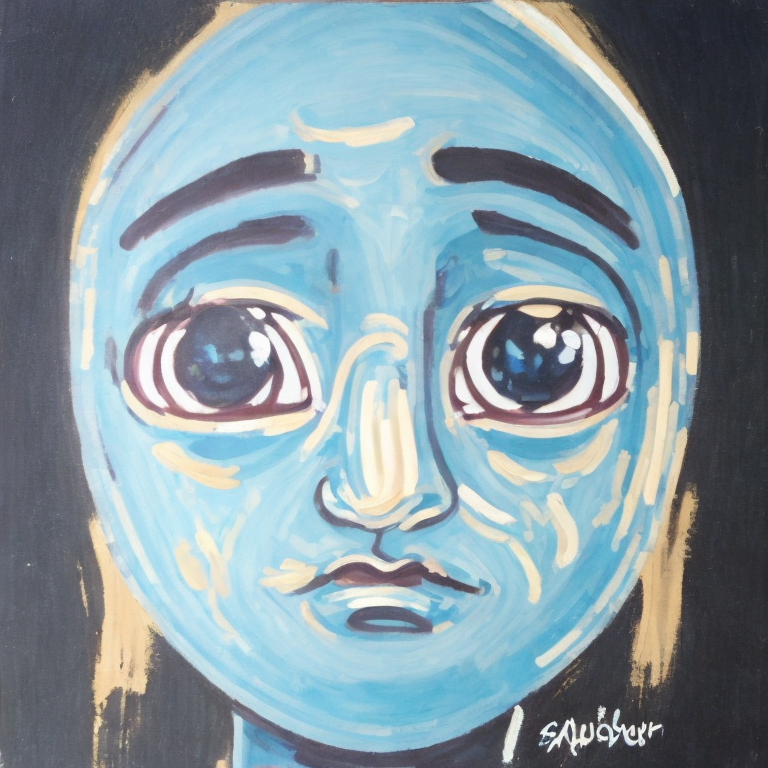

In [73]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher sad painting"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

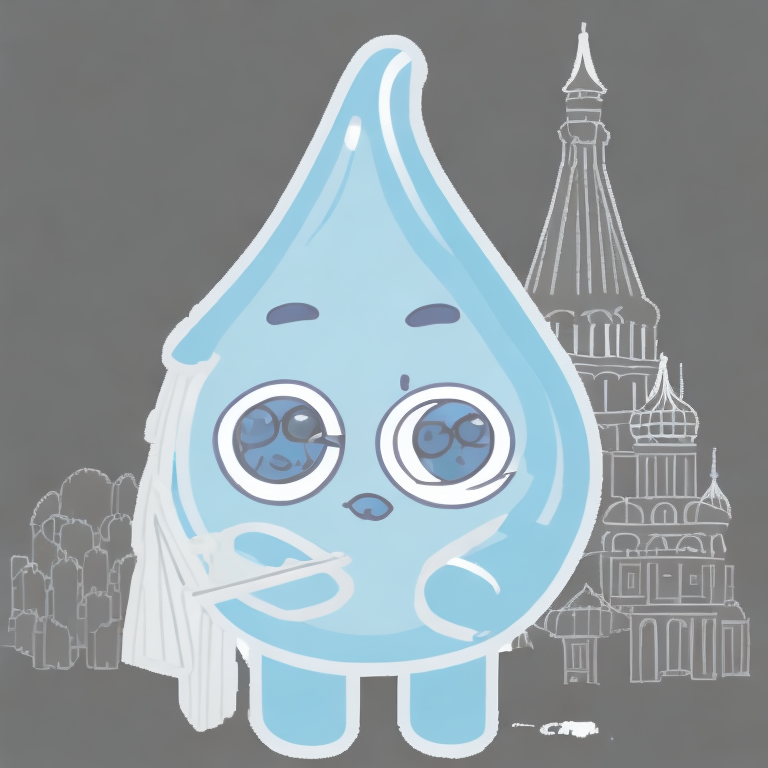

In [74]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher in Russia"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

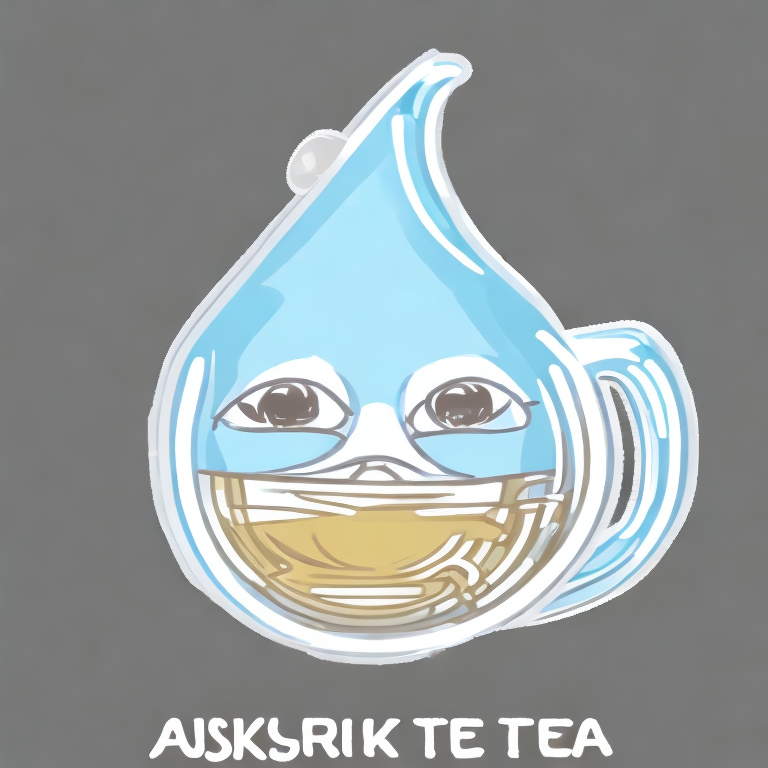

In [75]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher drink tea"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

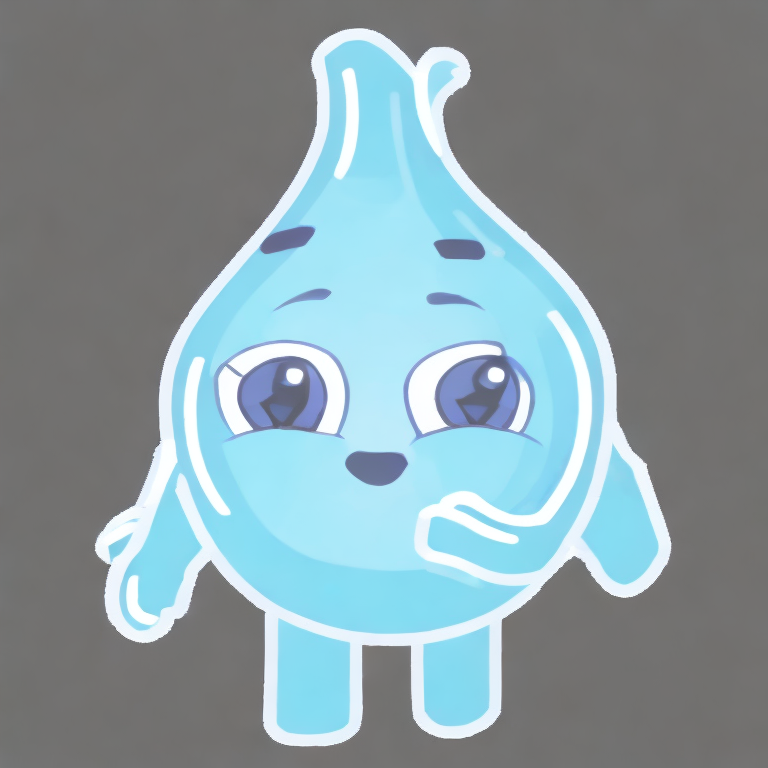

In [76]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher runing"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

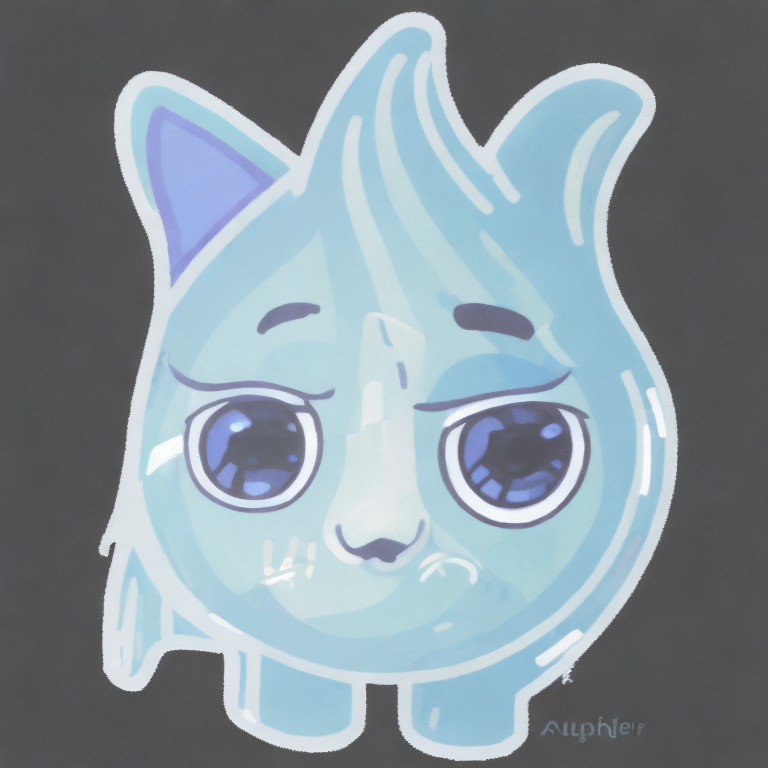

In [78]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher realism"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

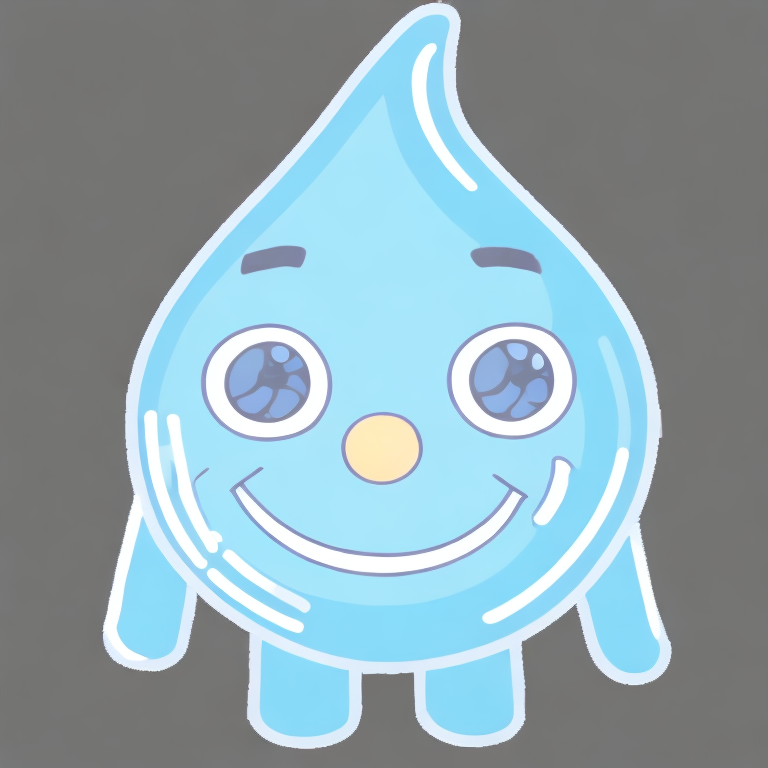

In [79]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher smiles realism"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

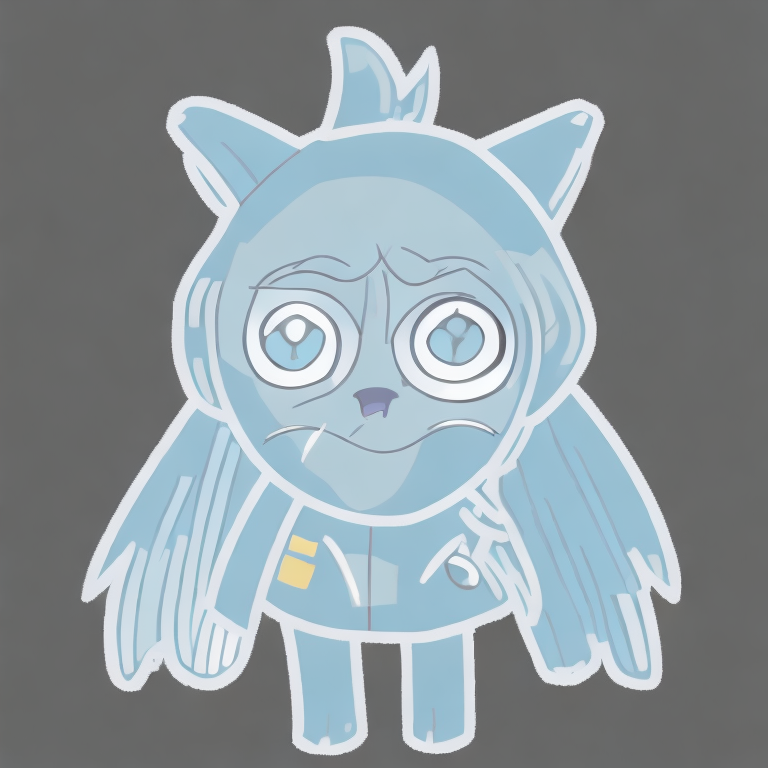

In [80]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher anime-style"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

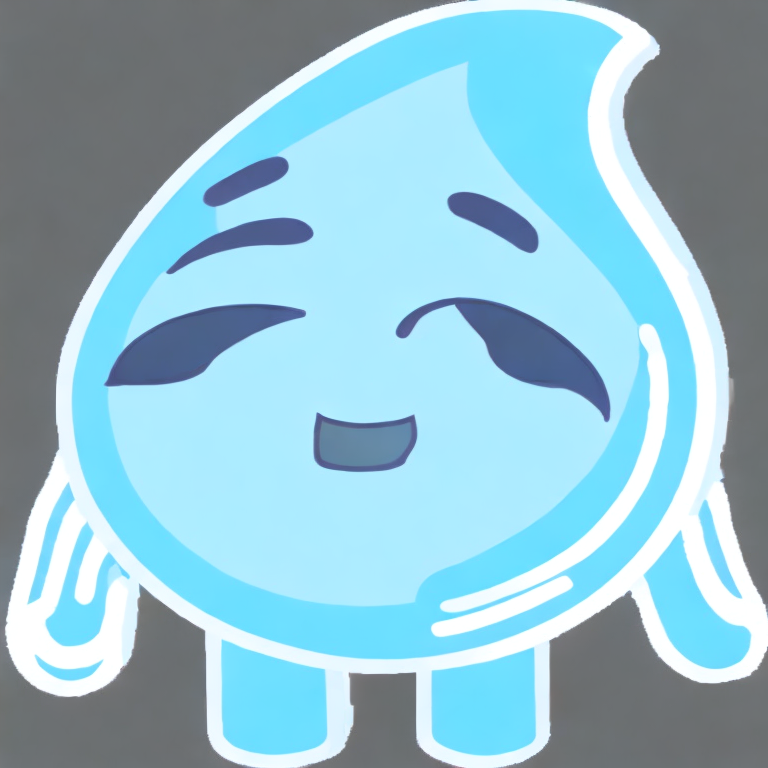

In [83]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["Apusher crying"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

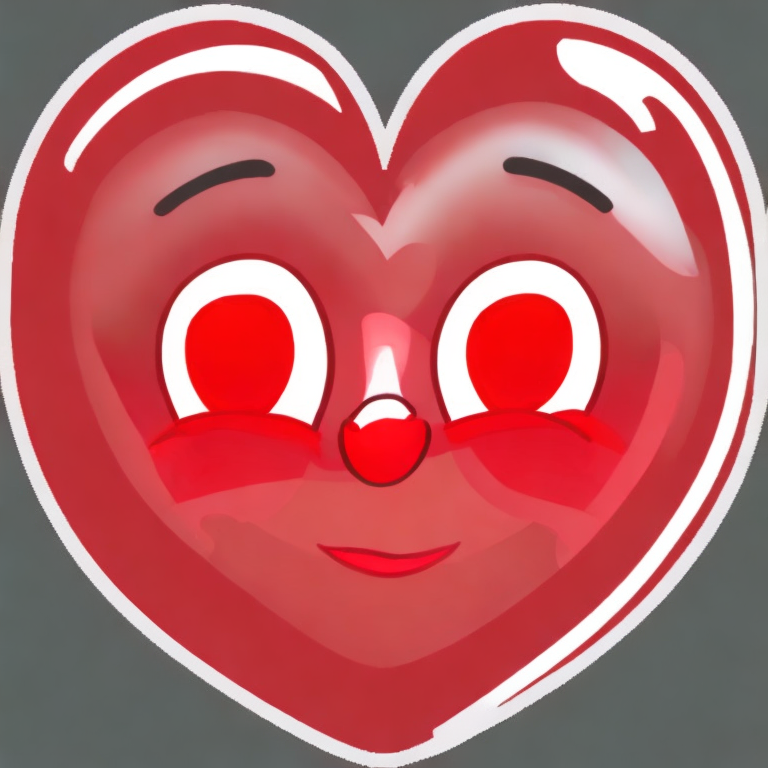

In [86]:
lora_scale = 0.9
pipeline_output = pipeline(
    prompt=["full red heart with an Apusher face"],
    num_inference_steps=20,
    cross_attention_kwargs={"scale": lora_scale},
    generator=torch.manual_seed(101)
)
pipeline_output.images[0]


In [47]:
torch.save(unet.state_dict(), '/kaggle/working/unet_v2.pkl')